<a href="https://colab.research.google.com/github/AlexandreLarget/CNN_what_do_you_see/blob/main/CNN_visualisation_filters_portfolio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CNN, CNN, what do you see ?

Neural networks are always refered to black-box because it is hard to understand individually the work of each neuron and how they interact between each other.

Here we gonna try to open this black-box and try to understand how a neural network is actually able to see things.

To do so, we will work on maybe the most popular Convoluional neuron network (CNN), the VGG16.
Despite its age, it was first introduced in 2014, it is still used in many cases and applications and keep producing amazing results compared to newer architectures (ResNet or Inceptions for exemple).

## 1.Import the model

First we import the model and cut its 3 last layers (fully connected layers). 

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.applications.vgg16 import VGG16
import PIL
from PIL import Image
import numpy as np
import pandas as pd

In [ ]:
import os.path
from os import path

my_path = '/content/img_extraction'
if path.exists(my_path) == False:
  os.mkdir(my_path)

In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-c4760487-9a8d-92a6-03f8-c314133700ee)


In [ ]:
model_1 = VGG16(include_top=False, weights="imagenet", input_shape=(224, 224, 3))

58889256/58889256 [==============================] - 3s 0us/step


In [ ]:
model_2 = VGG16(include_top=False, weights=None, input_shape=(224, 224, 3))

In [ ]:
model_1.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

## 2.Identify the layers 

The VGG16 is made of 5 convolutional blocks.
Each image that goes through the model will go through each block.
The image will see its size decreasing between each block allowing the model to focus on different elements of the image. 

We will identify a layer in each block to see what it actually sees.

In [ ]:
layer_outputs_1 = [layer.output for layer in model_1.layers if "conv2" in layer.name or "flatten" in layer.name]
layer_outputs_1

[<KerasTensor: shape=(None, 224, 224, 64) dtype=float32 (created by layer 'block1_conv2')>,
 <KerasTensor: shape=(None, 112, 112, 128) dtype=float32 (created by layer 'block2_conv2')>,
 <KerasTensor: shape=(None, 56, 56, 256) dtype=float32 (created by layer 'block3_conv2')>,
 <KerasTensor: shape=(None, 28, 28, 512) dtype=float32 (created by layer 'block4_conv2')>,
 <KerasTensor: shape=(None, 14, 14, 512) dtype=float32 (created by layer 'block5_conv2')>]

In [ ]:
activation_model_1 = tf.keras.Model(model_1.input, layer_outputs_1)

In [ ]:
layer_outputs_2 = [layer.output for layer in model_2.layers if "conv2" in layer.name or "flatten" in layer.name]
activation_model_2 = tf.keras.Model(model_2.input, layer_outputs_2)

In [ ]:
activation_model_2.save("activation_model_2.h5")

## 3.Visualization tests with uploaded images

We upload random images and send it through the 2 models.

For each model, we display subplots of the images after its been through each convolutional layer.
In a second time, we aggregate all the matrix each layer's output and plot it.

In [ ]:
def img_preprocessing(image):
  """
  Preprocess an image for our model by resizing it and normalizing it.
  """
  img = np.asarray(image)
  img = tf.image.resize(img, size=[224,224])
  img = img / 255.0
  return img

In [ ]:
import random

def display_activation_plots(num_layer, activation, n_plot=48, random_idx=False, save=None):
  """
  Returns subplots of random images from prediction of a particular layer of a deep learning model.
  x = col_size * row_size

    Parameters:
      num_layer (int): index of Conv block targeted (between 0 and 5)
      activations (list): prediction from a Keras model
      n_plot (int): number of plots to display
      random_idx (bool): if True, pick random index to disply matrix, otherwise pick the index of the matrix with the highest sum
      save (str): if is not None, save the plots

    Returns:
      subplots (plot): subplots of images after been processed by the selected model of the layer

  """

  # Create DataFrame and matrix
  mat_idx = []
  mat_sum = []
  matrix = activation[num_layer][0]
  for i in range(len(matrix[0][0])):
    mat_idx.append(i)
    mat_sum.append(matrix[:,:,i].sum())
  df = pd.DataFrame([mat_idx, mat_sum], index=["mat_idx", "mat_sum"]).T

  # Select matrix with the highest sum or random
  if random_idx:
    list_mat = random.choices(mat_idx, k=n_plot)
  else:
    list_mat = df.sort_values("mat_sum", ascending=False).head(n_plot).mat_idx.values.astype("int")

  # Define subplots dimensions
  if n_plot < 20:
    row_size = 2
  else: 
    row_size = 4

  col_size = int(len(list_mat) / row_size)

  # Plot the images
  fig, ax = plt.subplots(row_size , col_size, figsize=(row_size * 5, col_size * 0.6))
  fig.suptitle(f"Image dimension: {matrix.shape[0]}x{matrix.shape[1]} px \n Number of images at this step: {matrix.shape[2]}", y=1.1)

  i = 0
  for row in ax:
    for col in row:
      col.imshow(matrix[:,:,list_mat[i]])
      col.set_title(f"mat idx: {list_mat[i]}", fontsize=10)
      col.axis("off")
      i += 1
  if save is not None:
    plt.savefig(f"{my_path}/{save}_img_dim_{matrix.shape[0]}_{matrix.shape[1]}_{i}.png", format="png")

In [ ]:
def display_aggregated_matrix_plot(num_layer, activation, save=None):
  # Create DataFrame and matrix
  matrix = activation[num_layer][0]
  matrix_agg = np.zeros([matrix.shape[0],matrix.shape[1]])
  for i in range(matrix.shape[2]):
    matrix_agg += (matrix[:,:,i])**2
  matrix_agg *= 255.0/matrix_agg.max()
  plt.figure()
  plt.imshow(matrix_agg)
  if save is not None:
    plt.savefig(f"{my_path}/{save}_aggregated_img_dim_{matrix.shape[0]}_{matrix.shape[1]}.png", format="png")

### First image

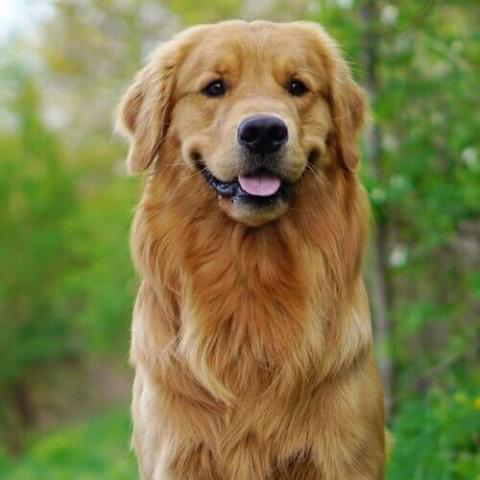

In [ ]:
image_1 = Image.open("golden.jpg")
image_1.show()

In [ ]:
img_1 = img_preprocessing(image_1)

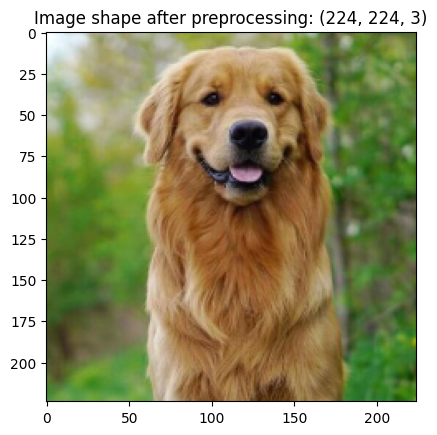

In [ ]:
import matplotlib.pyplot as plt
plt.title(f"Image shape after preprocessing: {img_1.shape}")
plt.imshow(img_1)
plt.show()

In [ ]:
activation_11 = activation_model_1.predict(tf.expand_dims(img_1,0))
activation_12 = activation_model_2.predict(tf.expand_dims(img_1,0))

1/1 [==============================] - 0s 120ms/step


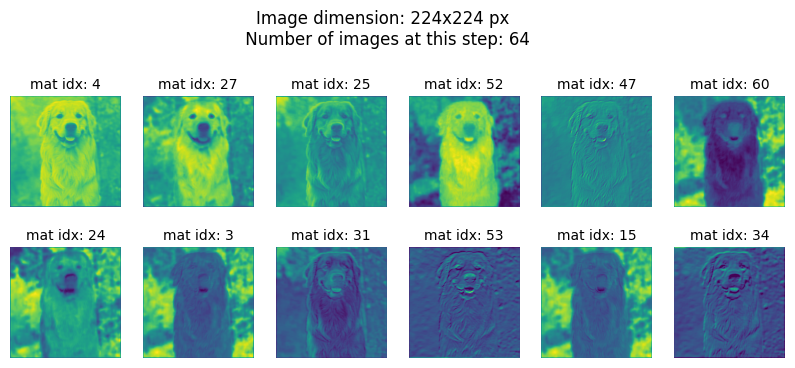

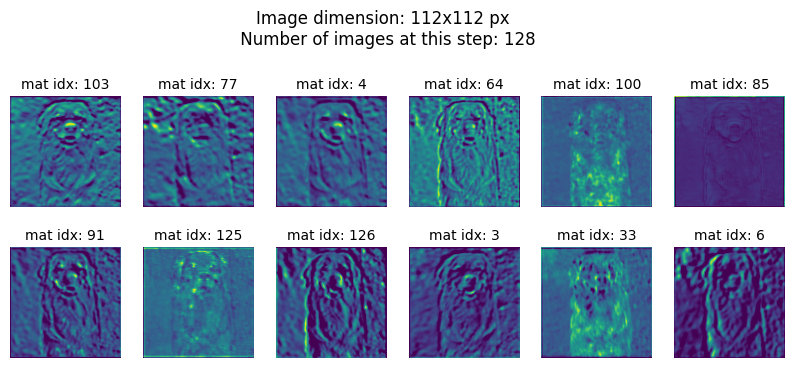

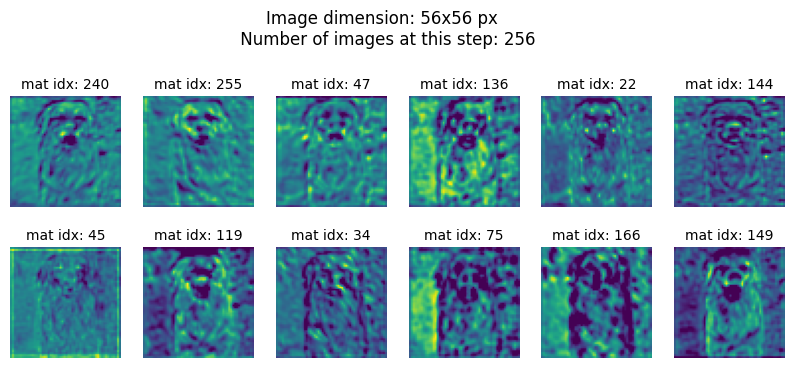

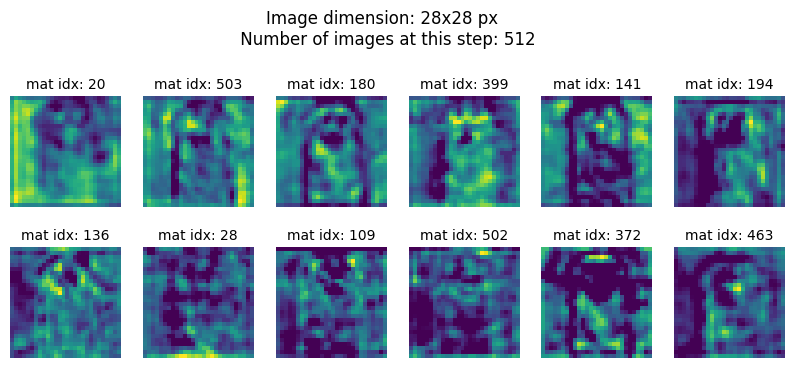

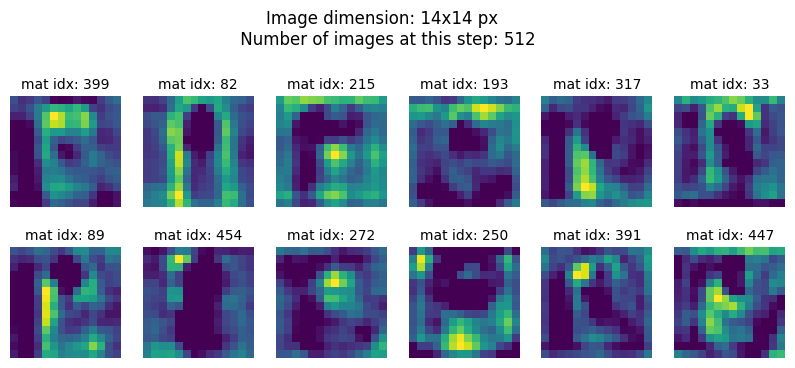

In [ ]:
for i in range(len(activation_11)):
  display_activation_plots(num_layer=i, activation=activation_11, n_plot=12, save="golden_model1")

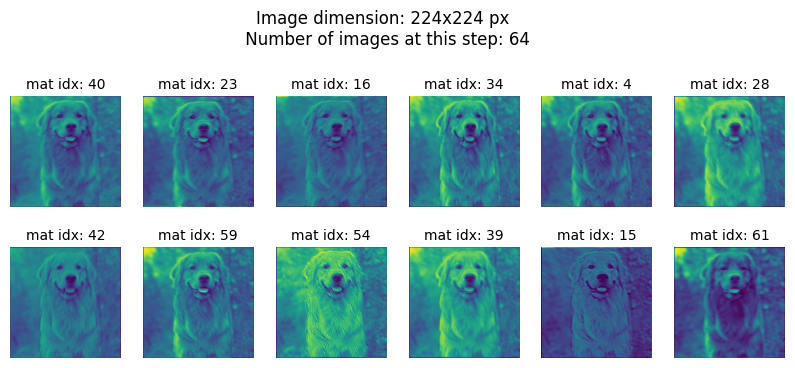

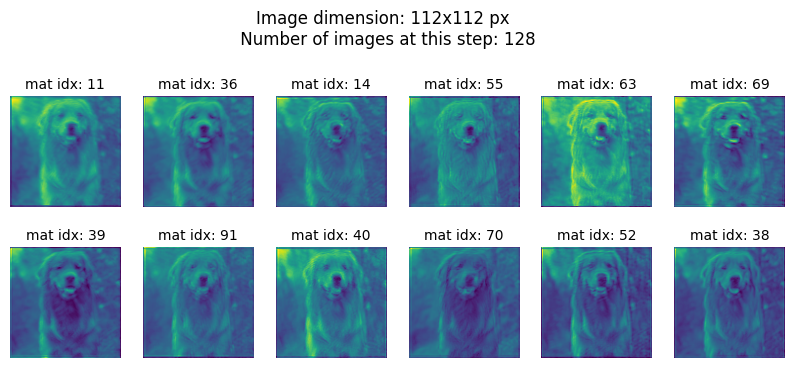

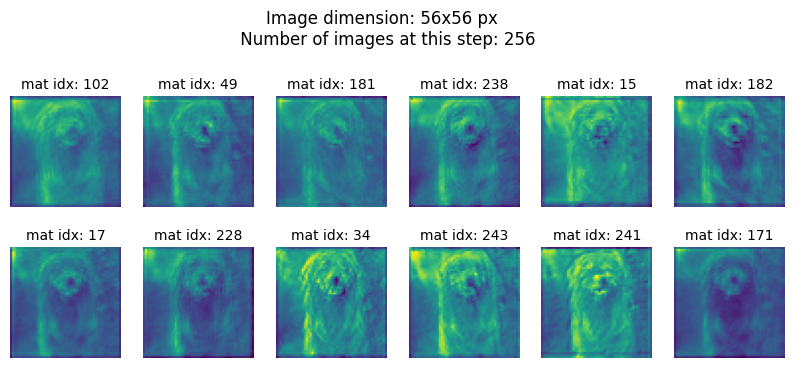

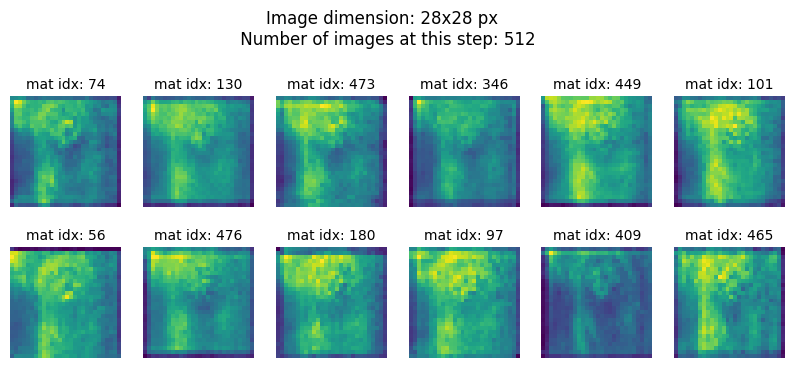

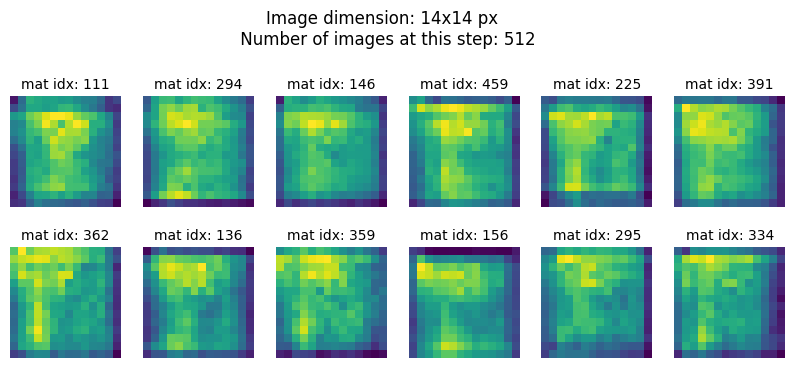

In [ ]:
for i in range(len(activation_12)):
  display_activation_plots(num_layer=i, activation=activation_12, n_plot=12, random_idx=False, save="golden_model2")

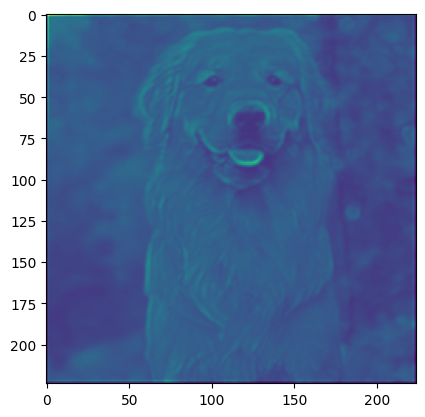

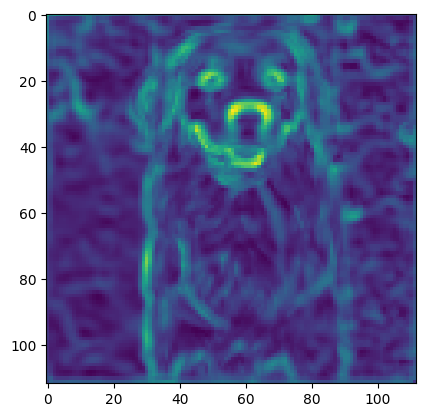

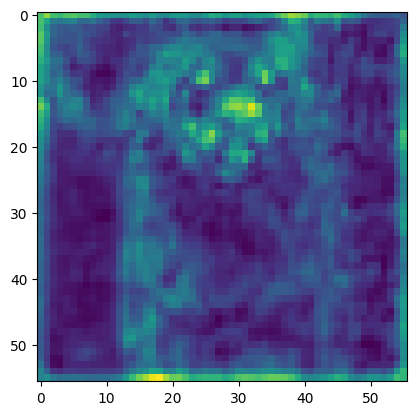

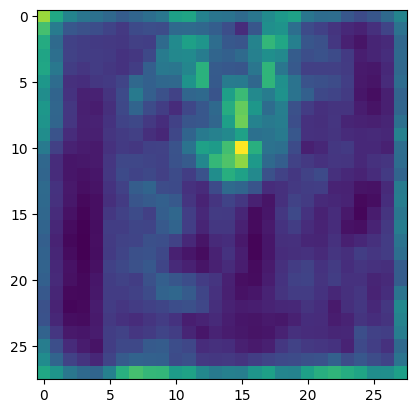

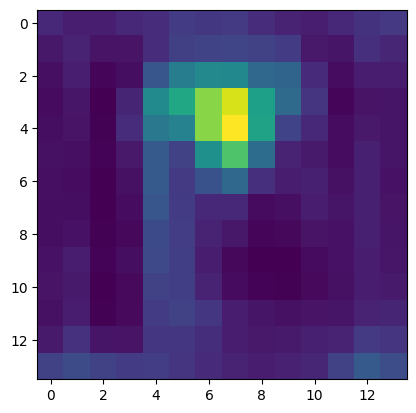

In [ ]:
for i in range(len(activation_11)):
  display_aggregated_matrix_plot(num_layer=i, activation=activation_11, save="golden_model1")

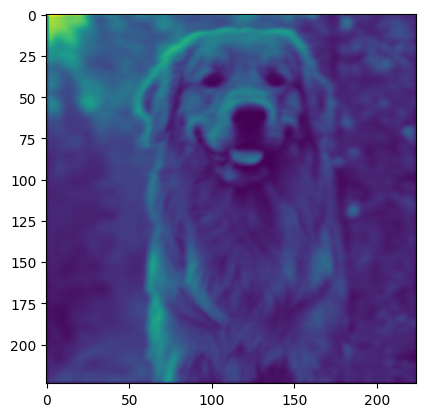

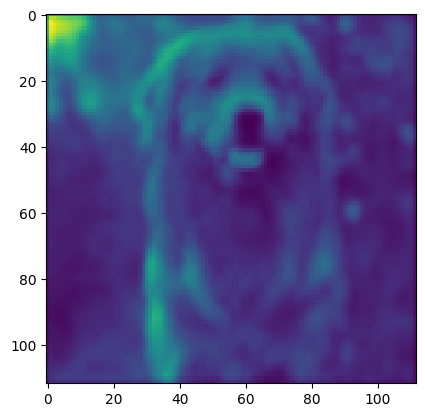

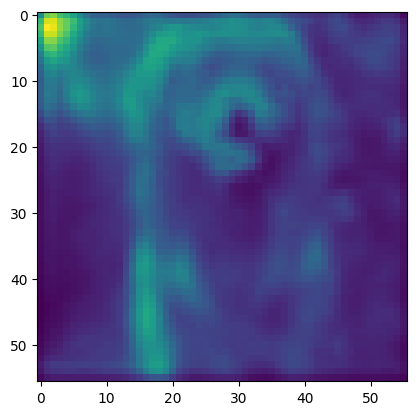

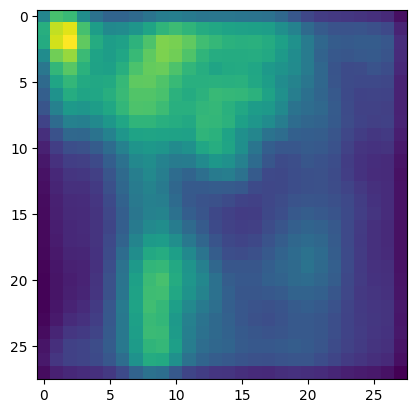

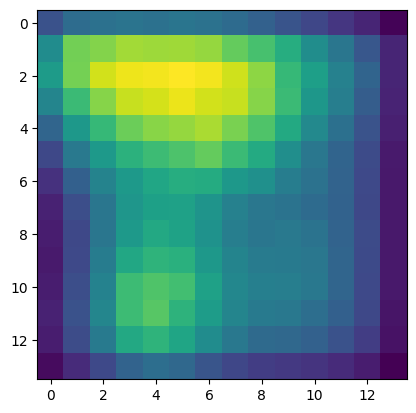

In [ ]:
for i in range(len(activation_12)):
  display_aggregated_matrix_plot(num_layer=i, activation=activation_12, save="golden_model2")

### Second image

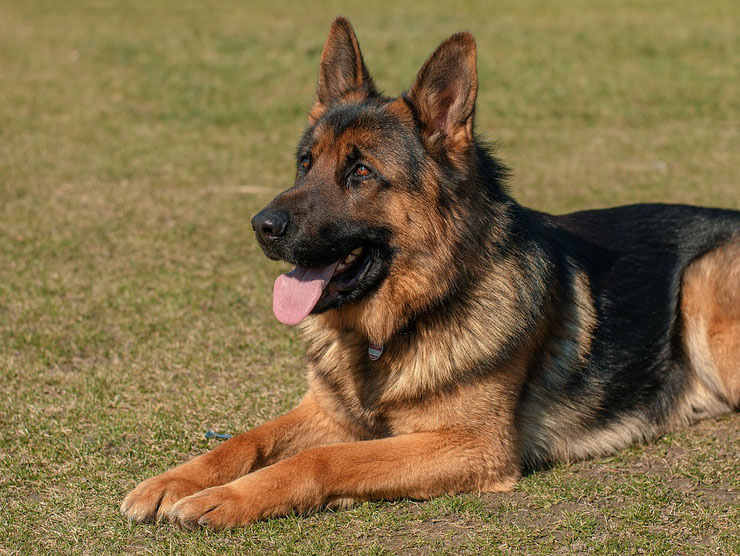

In [ ]:
image_2 = Image.open("germanshepard.jpg")
image_2.show()

In [ ]:
img_2 = img_preprocessing(image_2)

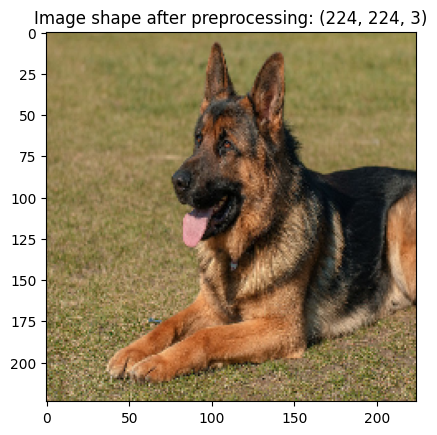

In [ ]:
plt.title(f"Image shape after preprocessing: {img_2.shape}")
plt.imshow(img_2)
plt.show()

In [ ]:
activation_21 = activation_model_1.predict(tf.expand_dims(img_2,0))
activation_22 = activation_model_2.predict(tf.expand_dims(img_2,0))

1/1 [==============================] - 0s 33ms/step


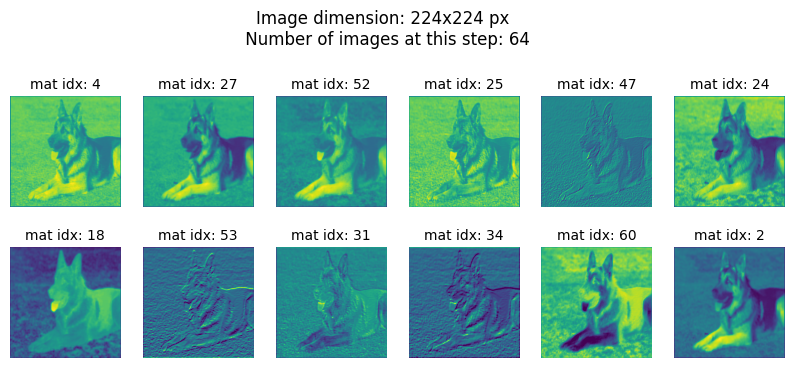

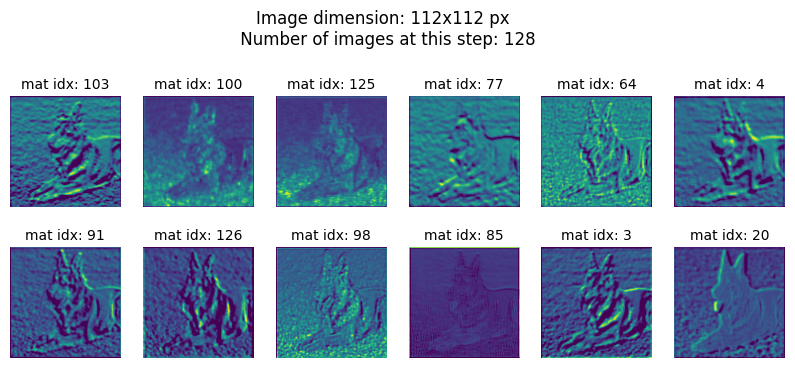

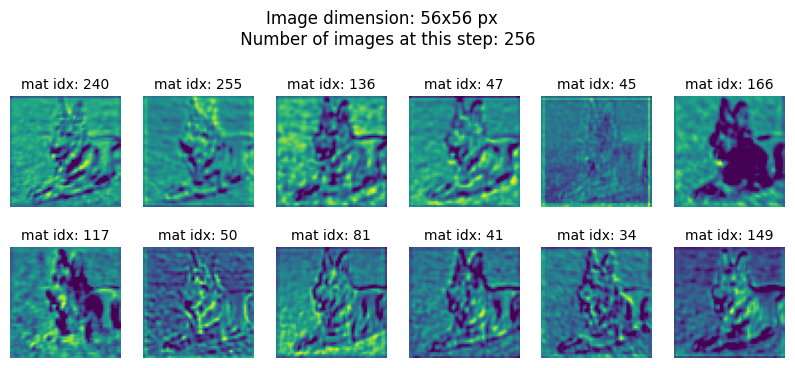

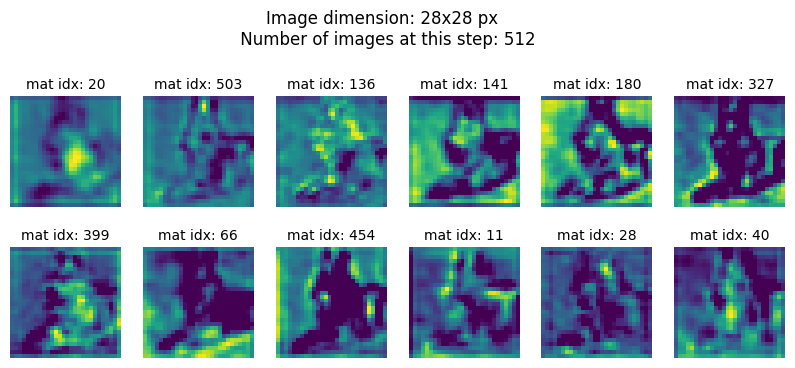

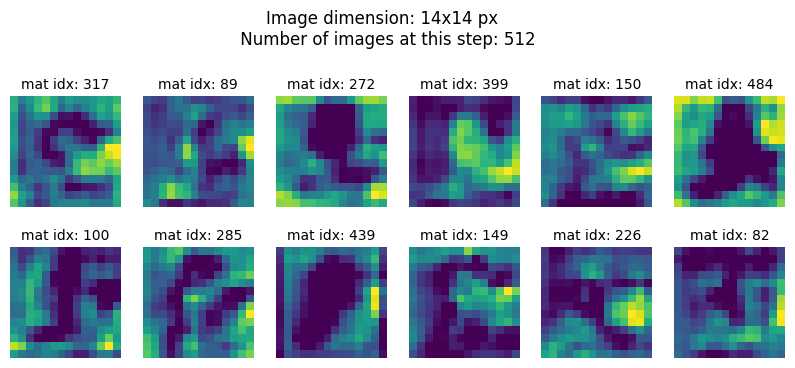

In [ ]:
for i in range(len(activation_21)):
  display_activation_plots(num_layer=i, activation=activation_21, n_plot=12, save="germanshepard_model1")

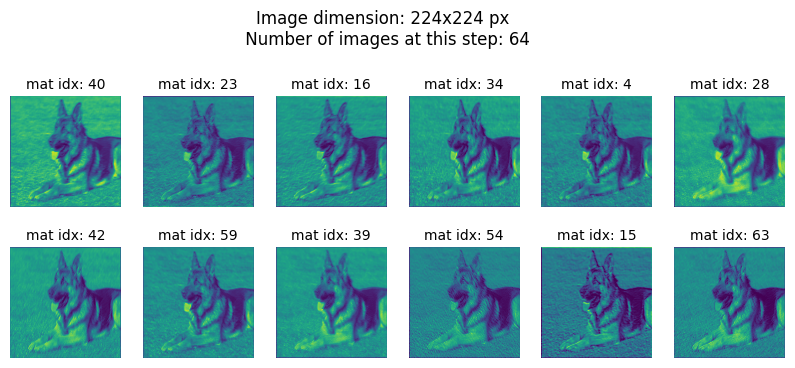

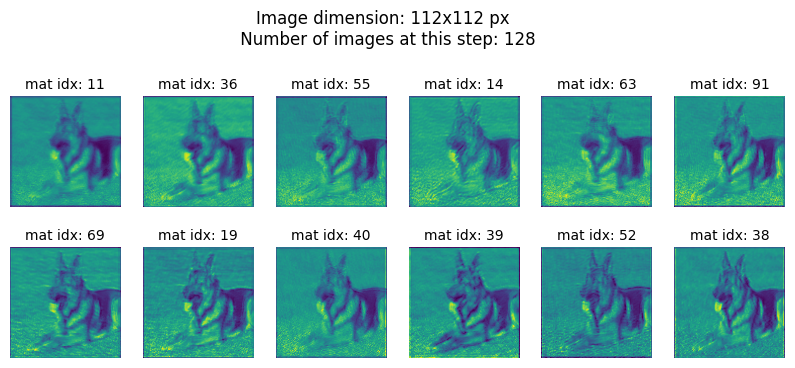

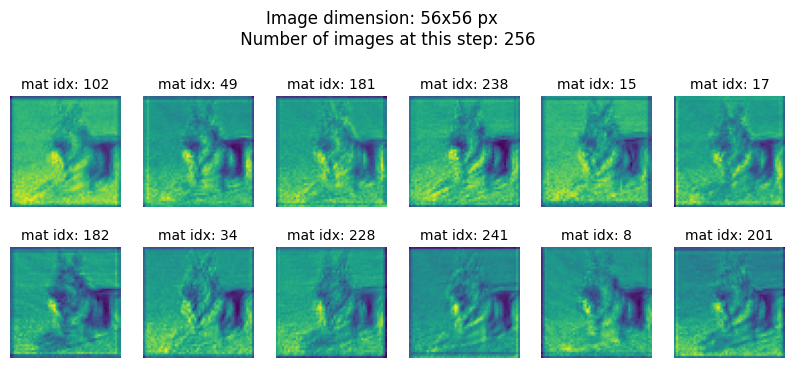

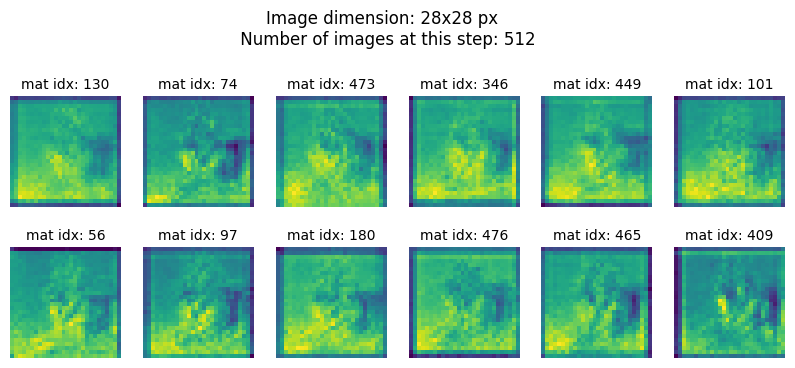

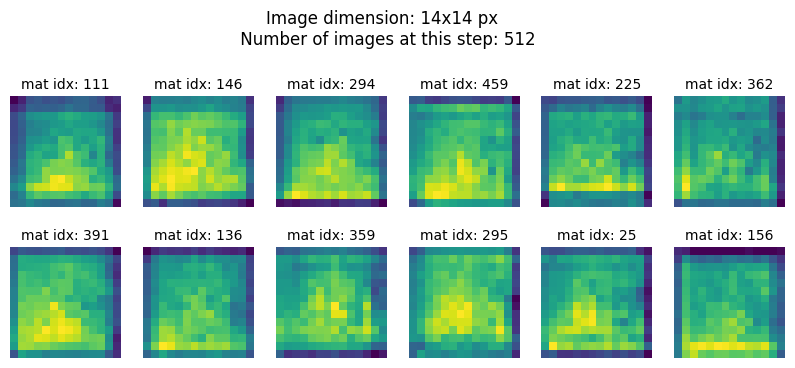

In [ ]:
for i in range(len(activation_22)):
  display_activation_plots(num_layer=i, activation=activation_22, n_plot=12, save="germanshepard_model2")

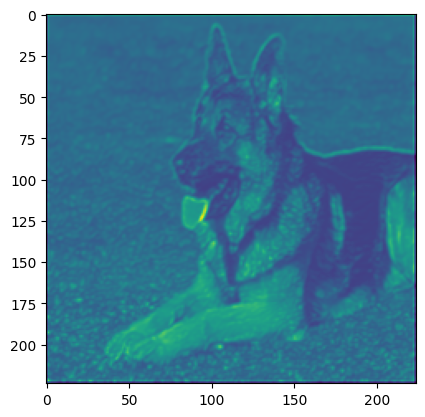

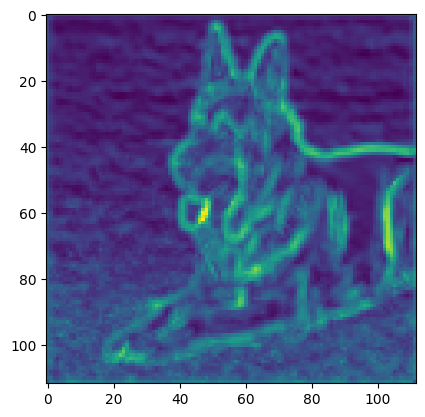

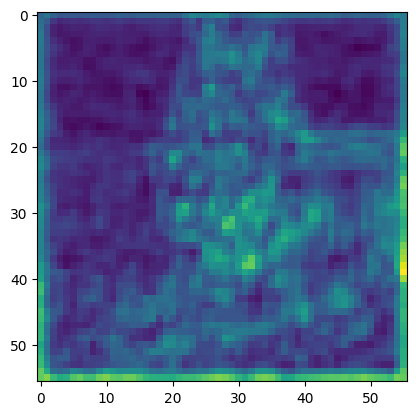

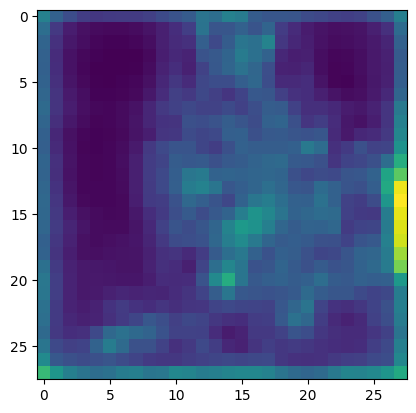

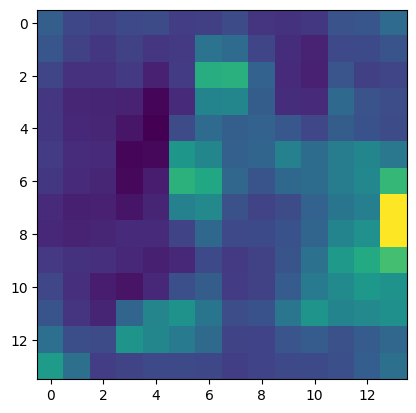

In [ ]:
for i in range(len(activation_21)):
  display_aggregated_matrix_plot(num_layer=i, activation=activation_21, save="germanshepard_model1")

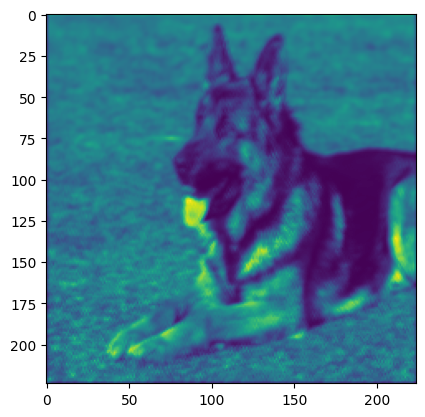

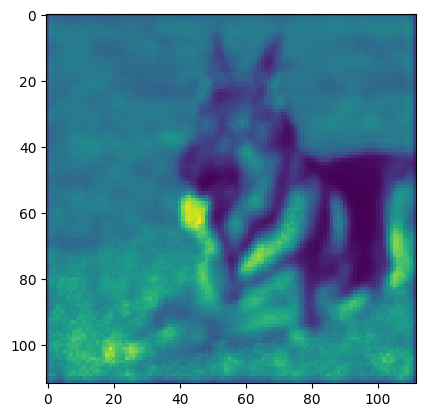

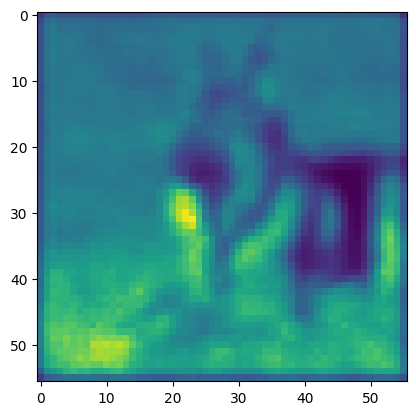

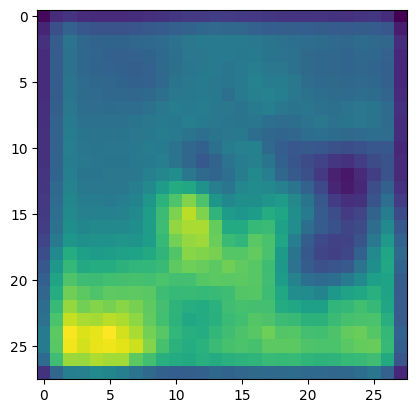

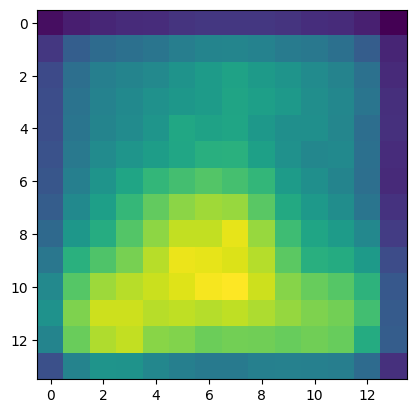

In [ ]:
for i in range(len(activation_22)):
  display_aggregated_matrix_plot(num_layer=i, activation=activation_22, save="germanshepard_model2")

### Third image

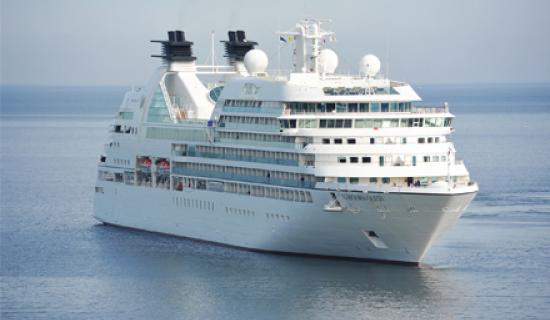

In [ ]:
image_3 = Image.open("boat.jpg")
image_3.show()

In [ ]:
img_3 = img_preprocessing(image_3)

In [ ]:
activation_31 = activation_model_1.predict(tf.expand_dims(img_3,0))
activation_32 = activation_model_2.predict(tf.expand_dims(img_3,0))

1/1 [==============================] - 0s 18ms/step


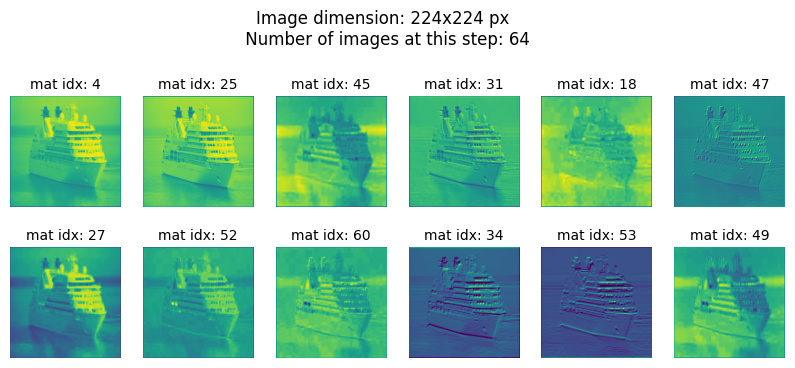

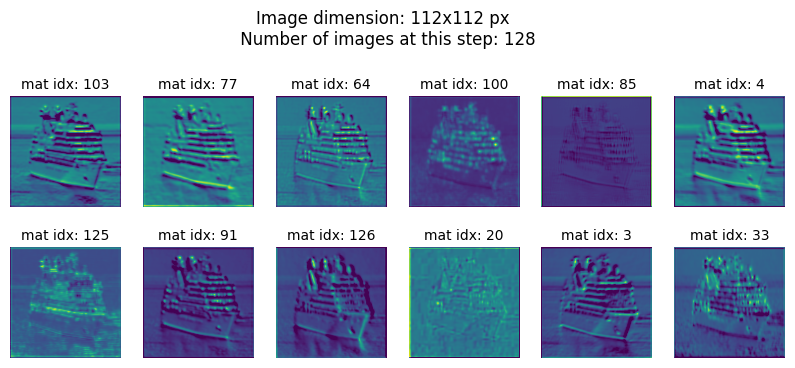

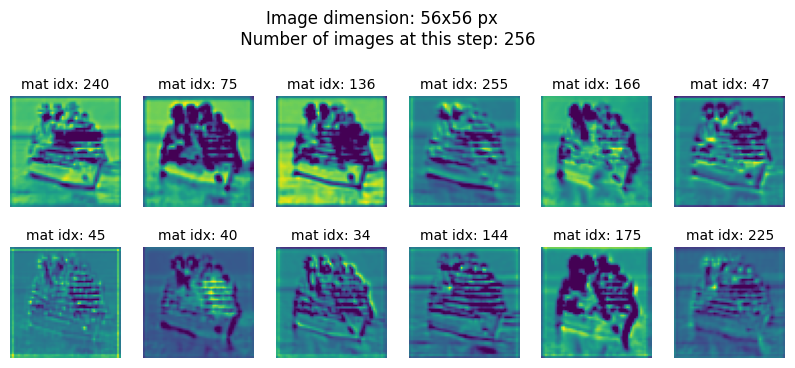

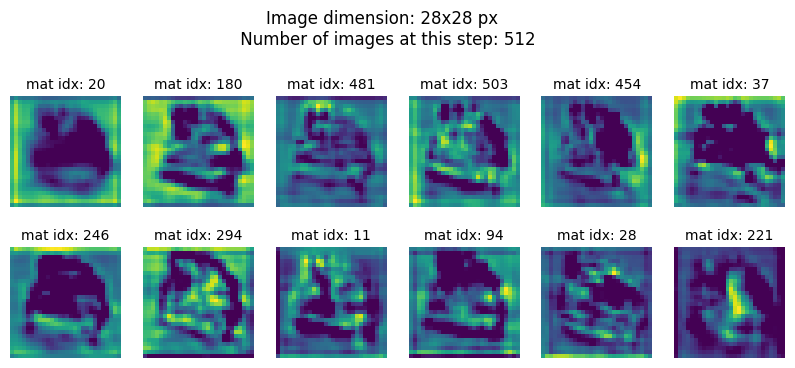

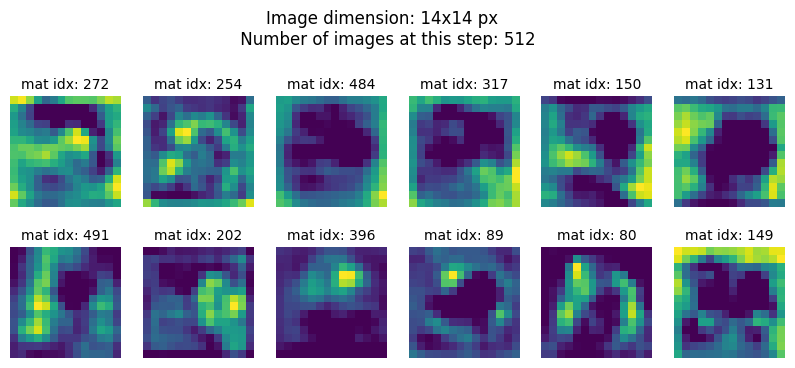

In [ ]:
for i in range(len(activation_31)):
  display_activation_plots(num_layer=i, activation=activation_31, n_plot=12, save="boat_model1")

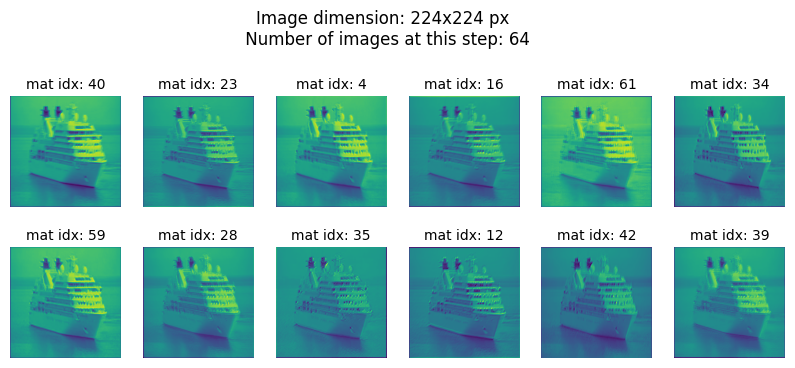

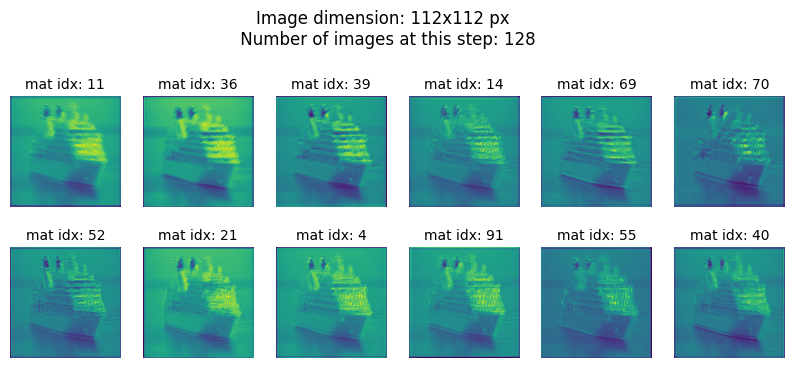

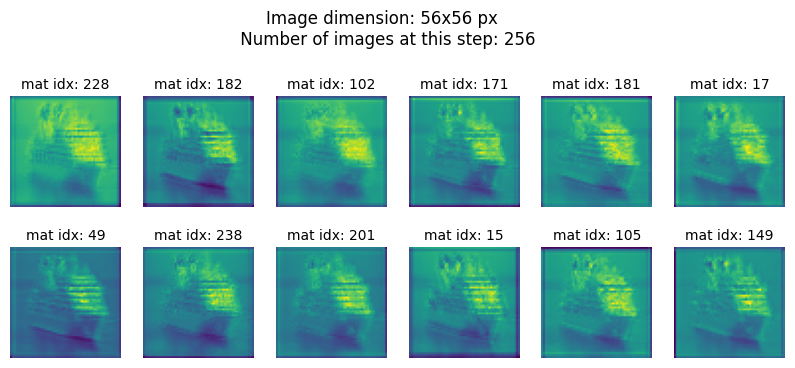

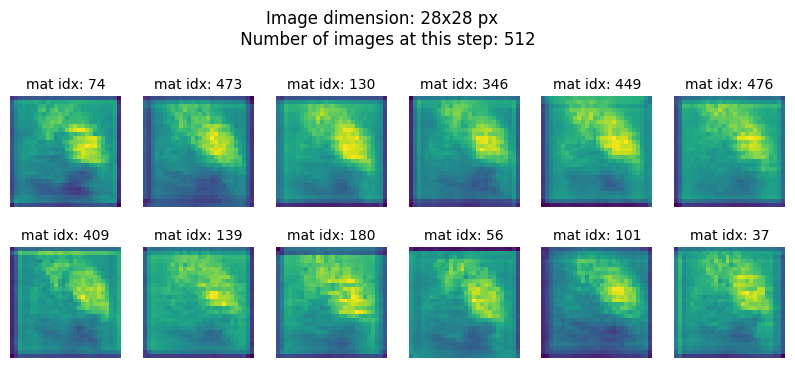

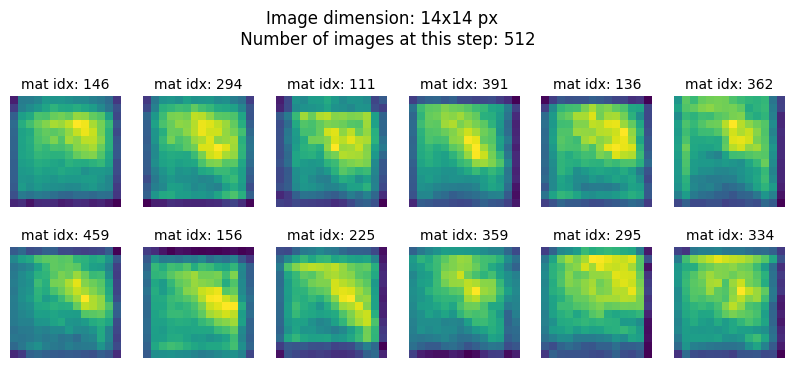

In [ ]:
for i in range(len(activation_32)):
  display_activation_plots(num_layer=i, activation=activation_32, n_plot=12, save="boat_model2")

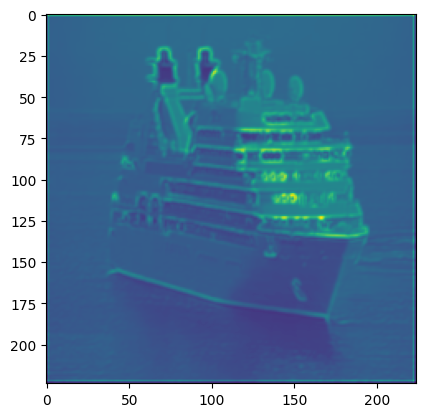

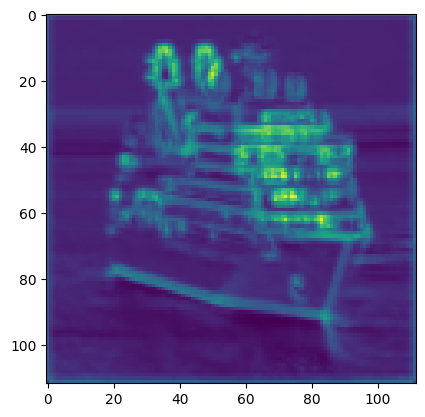

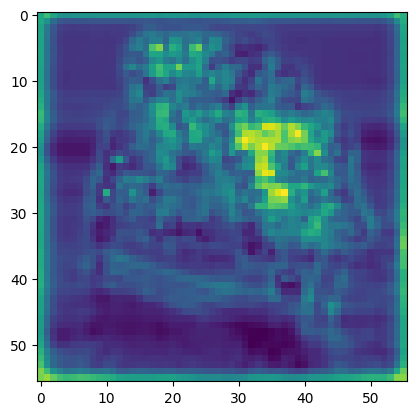

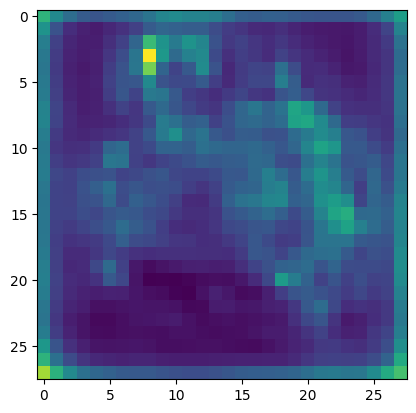

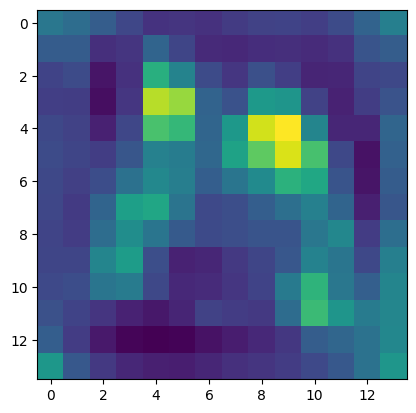

In [ ]:
for i in range(len(activation_31)):
  display_aggregated_matrix_plot(num_layer=i, activation=activation_31, save="boat_model1")

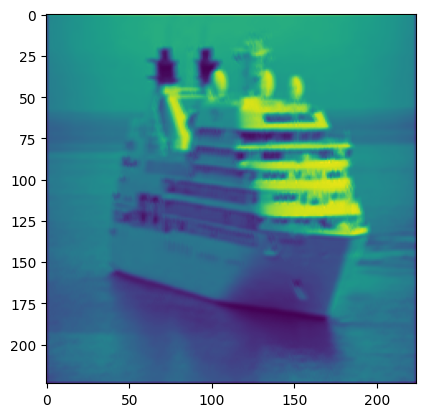

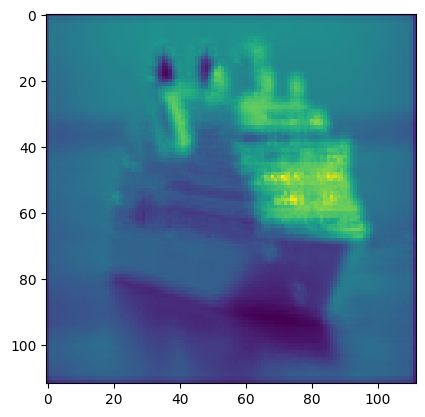

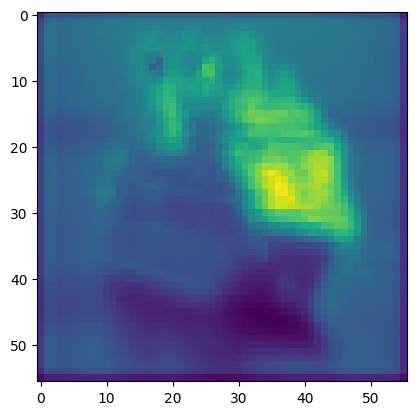

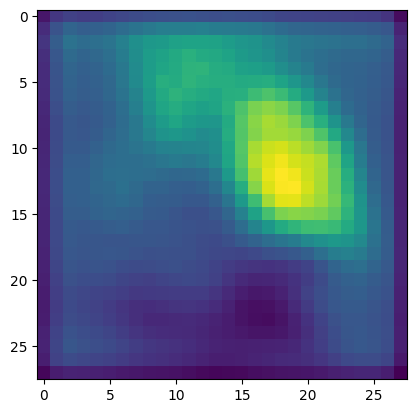

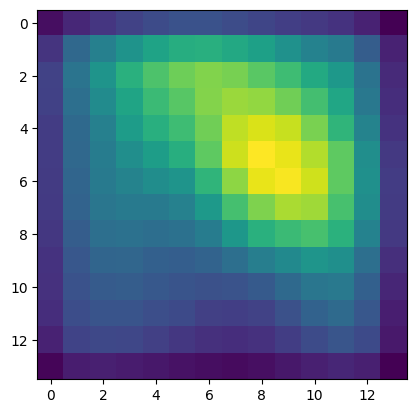

In [ ]:
for i in range(len(activation_32)):
  display_aggregated_matrix_plot(num_layer=i, activation=activation_32, save="boat_model2")

In [ ]:
!zip -r /content/img_extraction.zip /content/img_extraction

  adding: content/img_extraction/ (stored 0%)
  adding: content/img_extraction/golden_model2_img_dim_28_28_12.png (deflated 9%)
  adding: content/img_extraction/golden_model2_aggregated_img_dim_28_28.png (deflated 24%)
  adding: content/img_extraction/boat_model2_img_dim_224_224_12.png (deflated 1%)
  adding: content/img_extraction/boat_model2_aggregated_img_dim_224_224.png (deflated 1%)
  adding: content/img_extraction/germanshepard_model1_img_dim_56_56_12.png (deflated 1%)
  adding: content/img_extraction/germanshepard_model2_img_dim_112_112_12.png (deflated 1%)
  adding: content/img_extraction/germanshepard_model2_img_dim_224_224_12.png (deflated 1%)
  adding: content/img_extraction/germanshepard_model1_aggregated_img_dim_112_112.png (deflated 6%)
  adding: content/img_extraction/golden_model1_img_dim_56_56_12.png (deflated 1%)
  adding: content/img_extraction/boat_model1_aggregated_img_dim_112_112.png (deflated 8%)
  adding: content/img_extraction/boat_model1_img_dim_14_14_12.png (

In [ ]:
#import shutil
#shutil.rmtree(my_path, ignore_errors=False, onerror=None)